# ControlNet with Stable Diffusion


### About the technique


## Installing the libraries

In [1]:
!pip install diffusers==0.14
!pip install -q accelerate transformers xformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 737.4/737.4 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 268.8/268.8 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.2/251.2 kB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 167.0/167.0 MB 10.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 97.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 62.9 MB/s eta 0:00:00


In [2]:
!pip install -q opencv-contrib-python
!pip install -q controlnet_aux

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 261.9/261.9 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 4.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 16.7 MB/s eta 0:00:00


In [3]:
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel
import torch
import cv2 #OpenCV
from PIL import Image
import numpy as np

In [4]:
def grid_img(imgs, rows=1, cols=3, scale=1):
  assert len(imgs) == rows * cols

  w, h = imgs[0].size
  w, h = int(w*scale), int(h*scale)

  grid = Image.new('RGB', size=(cols*w, rows*h))
  grid_w, grid_h = grid.size

  for i, img in enumerate(imgs):
      img = img.resize((w,h), Image.ANTIALIAS)
      grid.paste(img, box=(i%cols*w, i//cols*h))
  return grid

## Generating images using edges



### ControlNet model + Canny Edge



In [5]:
controlnet_canny_model = 'lllyasviel/sd-controlnet-canny'
control_net_canny = ControlNetModel.from_pretrained(controlnet_canny_model, torch_dtype=torch.float16)

In [6]:
pipe = StableDiffusionControlNetPipeline.from_pretrained('runwayml/stable-diffusion-v1-5',
                                                         controlnet=control_net_canny,
                                                         torch_dtype=torch.float16)

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [7]:
from diffusers import UniPCMultistepScheduler
pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

In [8]:
pipe.enable_attention_slicing()
pipe.enable_xformers_memory_efficient_attention()

In [9]:
pipe.enable_model_cpu_offload()

### Loading the image


In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


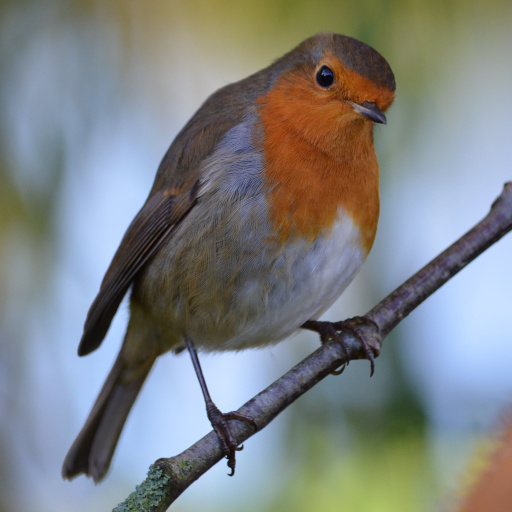

In [12]:
img = Image.open('/content/drive/MyDrive/Udemy/Image Generation/images/bird.jpg')
img

In [13]:
type(img)

PIL.JpegImagePlugin.JpegImageFile

### Detecting edges using Canny Edge  



In [14]:
def canny_edge(img, low_threshold = 100, high_threshold = 200):
  img = np.array(img)
  #print(type(img))
  #print(img.shape)
  img = cv2.Canny(img, low_threshold, high_threshold)
  #print(img.shape)
  img = img[:, :, None]
  #print(img.shape)
  img = np.concatenate([img, img, img], axis = 2)
  #print(img.shape)
  canny_img = Image.fromarray(img)
  #print(type(canny_img))
  return canny_img

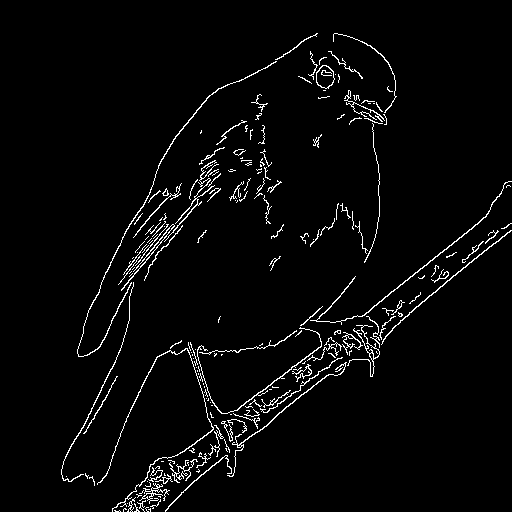

In [15]:
canny_img = canny_edge(img)
canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

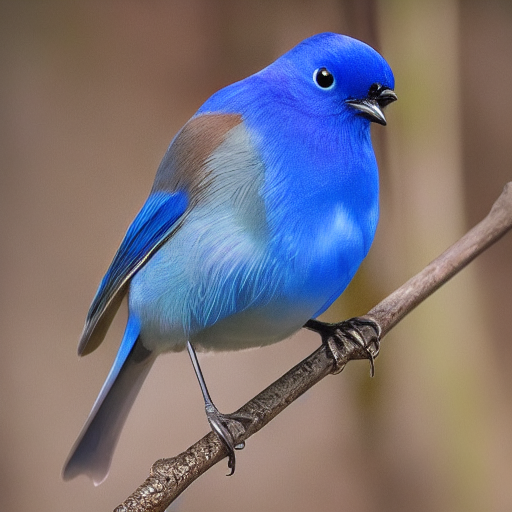

In [16]:
prompt = "realistic photo of a blue bird with purple details, high quality, natural light"
neg_prompt = ""

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

imgs.images[0]

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


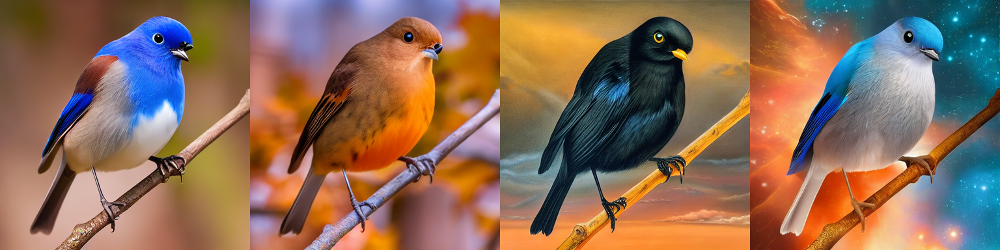

In [17]:
prompt = ["realistic photo of a blue bird with purple details, high quality, natural light",
          "realistic photo of a bird in new york during autumn, city in the background",
          "oil painting of a black bird in the desert, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "digital painting of a blue bird in space, stars and galaxy in the background, trending on artstation"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


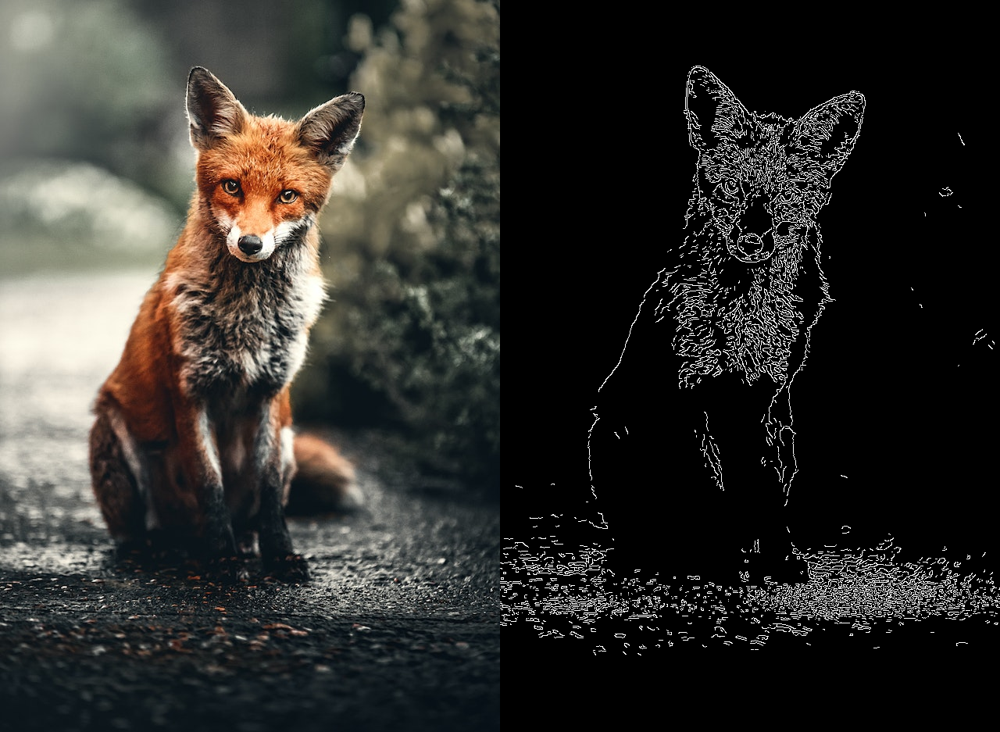

In [19]:
img = Image.open("/content/drive/MyDrive/Udemy/Image Generation/images/fox.jpg")

canny_img = canny_edge(img, 200, 255)

grid_img([img, canny_img], 1, 2)

In [20]:
prompt = ["realistic photo of a fox, high quality, natural light, sunset",
          "realistic photo of a fox in the snow, best quality, extremely detailed",
          "oil painting of fox the desert, canyons in the background, realistic, vivid, fantasy, surrealist, best quality, extremely detailed",
          "watercolor painting of a fox in space, blue and purple tones, stars and earth in the background"]

neg_prompt = ["blurred, lowres, bad anatomy, ugly, worst quality, low quality, monochrome, signature"] * len(prompt)

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = pipe(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, len(prompt), scale=0.75)

Output hidden; open in https://colab.research.google.com to view.

### Example using fine-tuned model





In [21]:
mph = StableDiffusionControlNetPipeline.from_pretrained("sd-dreambooth-library/mr-potato-head", controlnet=control_net_canny, torch_dtype=torch.float16)
mph.scheduler = UniPCMultistepScheduler.from_config(mph.scheduler.config)
mph.enable_model_cpu_offload()
mph.enable_xformers_memory_efficient_attention()

vae/diffusion_pytorch_model.safetensors not found


Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


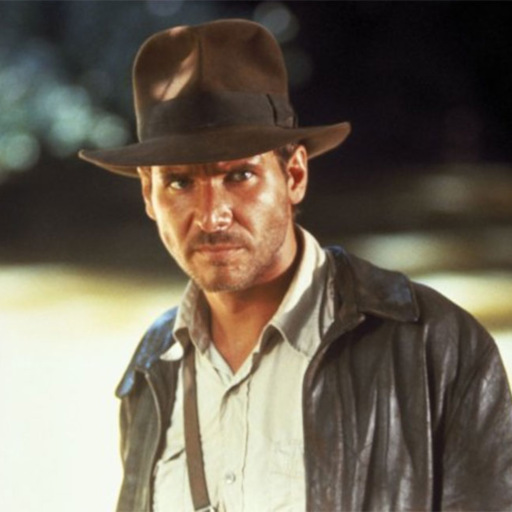

In [23]:
img = Image.open("/content/drive/MyDrive/Udemy/Image Generation/images/indiana-jones.jpg")
img

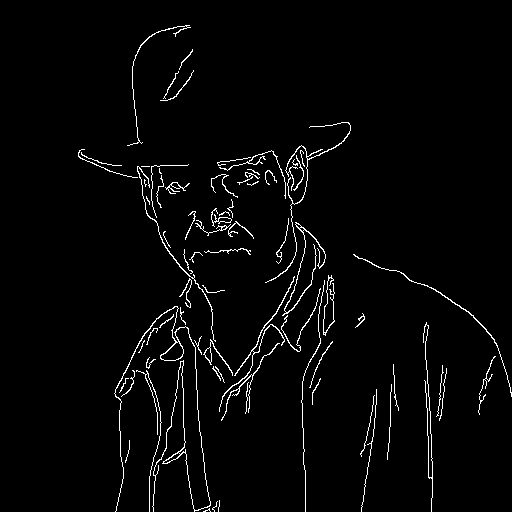

In [24]:
canny_img = canny_edge(img, 100, 255)
canny_img

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


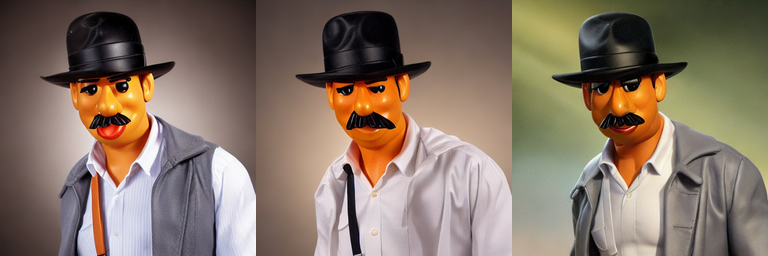

In [25]:
prompt = "photo of sks mr potato head wearing a black hat, best quality, extremely detailed"
neg_prompt = "ugly, desfigured, distorted face, poorly drawn face, monochrome"
num_imgs = 3

seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)
mph.safety_checker = None

imgs = mph(
    prompt,
    canny_img,
    negative_prompt=neg_prompt,
    num_images_per_prompt=num_imgs,
    generator=generator,
    num_inference_steps=20,
)

grid_img(imgs.images, 1, num_imgs, 0.5)

## Generating images using poses




### Loading the model to extract poses

In [26]:
from controlnet_aux import OpenposeDetector
pose_model = OpenposeDetector.from_pretrained('lllyasviel/ControlNet')

/usr/local/lib/python3.10/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(


### Loading the image

In [28]:
img_pose = Image.open('/content/drive/MyDrive/Udemy/Image Generation/images/pose01.jpg')

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


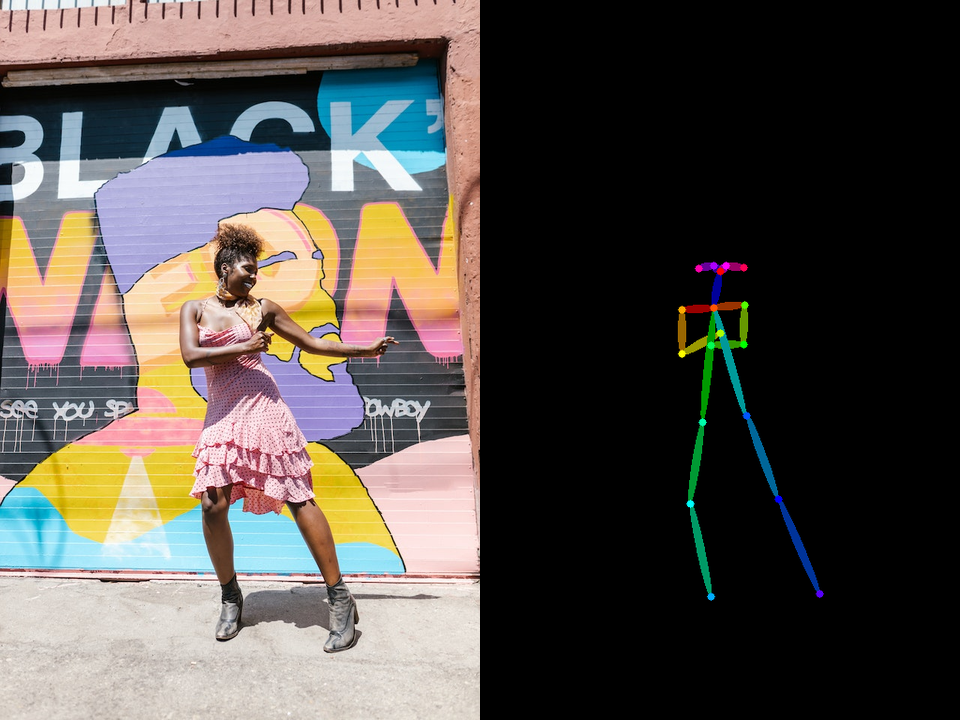

In [29]:
pose = pose_model(img_pose)
grid_img([img_pose, pose], rows=1, cols=2, scale=0.75)

### Loading the ControlNet model


In [30]:
controlnet_pose_model = ControlNetModel.from_pretrained('thibaud/controlnet-sd21-openpose-diffusers', torch_dtype=torch.float16)
sd_controlpose = StableDiffusionControlNetPipeline.from_pretrained('stabilityai/stable-diffusion-2-1-base',
                                                                   controlnet=controlnet_pose_model,
                                                                   torch_dtype=torch.float16)

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

In [31]:
sd_controlpose.enable_model_cpu_offload()
sd_controlpose.enable_attention_slicing()
sd_controlpose.enable_xformers_memory_efficient_attention()

In [32]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


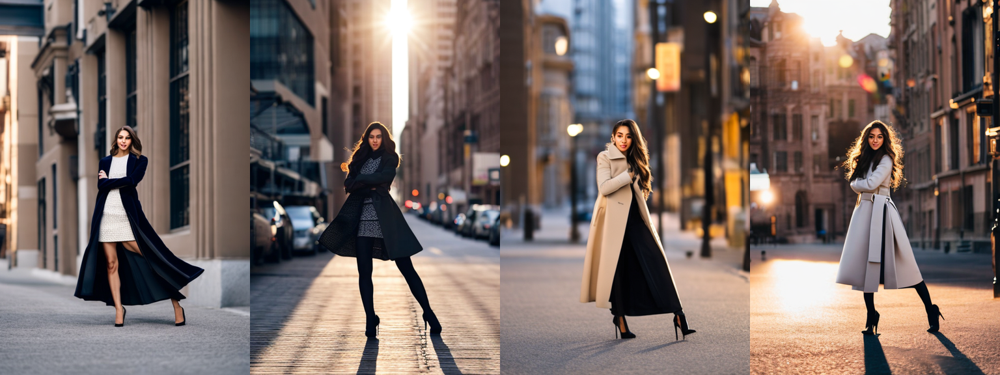

In [33]:
seed = 777
generator = torch.Generator(device="cuda").manual_seed(seed)
prompt = "professional photo of a young woman in the street, wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)

> Other tests

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


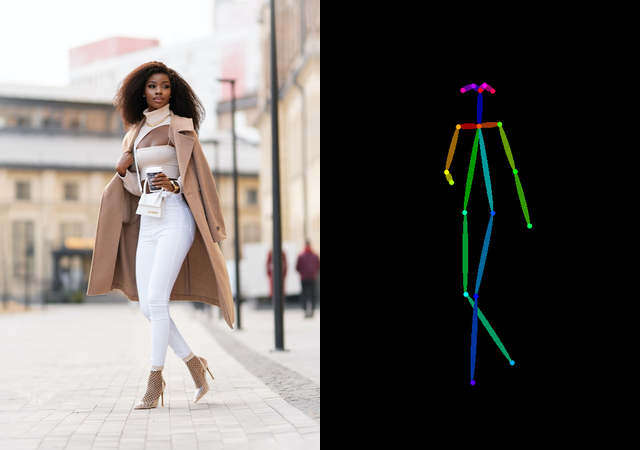

In [35]:
img_pose = Image.open("/content/drive/MyDrive/Udemy/Image Generation/images/pose02.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


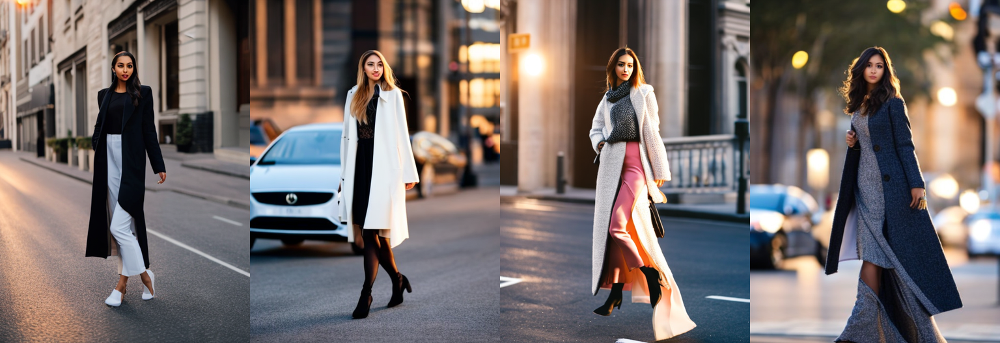

In [36]:
generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)


**To improve the results:**

* Test with differente schedulers. Euler A is also recommended for ControlNet
* Change the parameters (CFG, steps, etc.)
* Use good negative prompts
* Adjust the prompt to be similar to the initial pose
* It is recommended to provide more information regarding the action. For example, "walking in the street" tends to return better results than "in the street"
* You can use Inpainting to adjust faces that have not been correctly generated

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


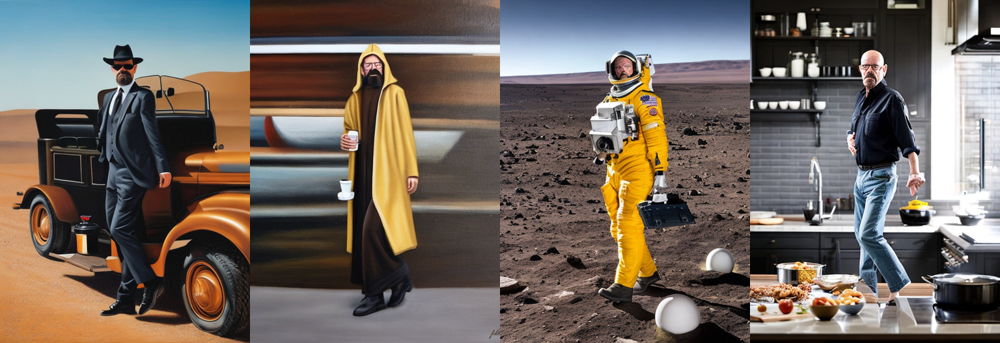

In [37]:
prompt = ["oil painting walter white wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting walter white wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of walter white wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of walter white in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)
num_imgs = 1

generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [38]:
from diffusers import EulerAncestralDiscreteScheduler

sd_controlpose.scheduler = EulerAncestralDiscreteScheduler.from_config(sd_controlpose.scheduler.config)

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


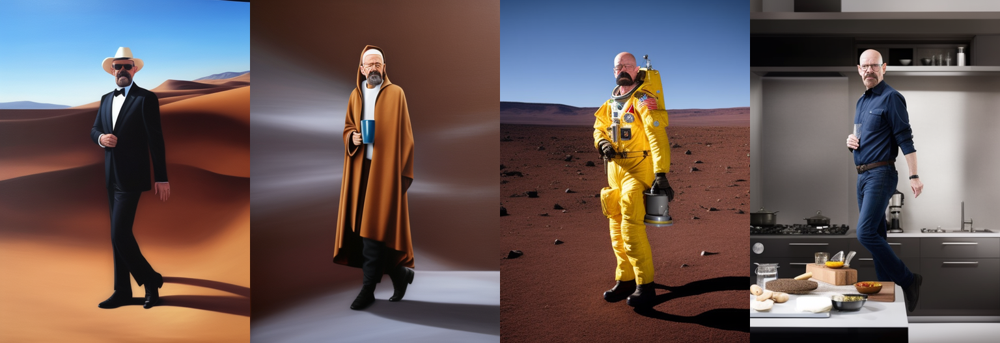

In [39]:
generator = torch.Generator(device="cuda").manual_seed(seed)
imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, len(prompt), 0.75)

In [40]:
from diffusers.utils import load_image

In [41]:
urls = "yoga1.jpeg", "yoga2.jpeg", "yoga3.jpeg", "yoga4.jpeg"
imgs = [load_image("https://hf.co/datasets/YiYiXu/controlnet-testing/resolve/main/" + url) for url in urls]

In [42]:
imgs

[<PIL.Image.Image image mode=RGB size=194x259>,
 <PIL.Image.Image image mode=RGB size=194x259>,
 <PIL.Image.Image image mode=RGB size=251x201>,
 <PIL.Image.Image image mode=RGB size=251x201>]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


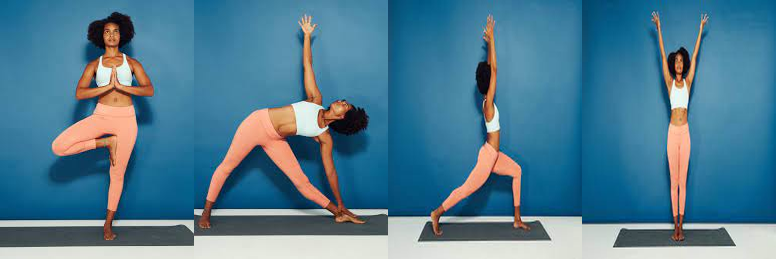

In [43]:
grid_img(imgs, rows=1, cols=4)

In [44]:
poses = [pose_model(img) for img in imgs]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


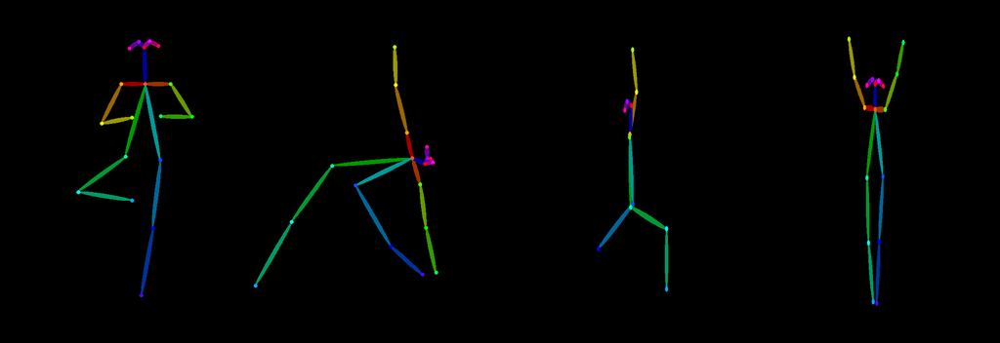

In [45]:
grid_img(poses, 1, 4, scale = 0.5)

  0%|          | 0/30 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


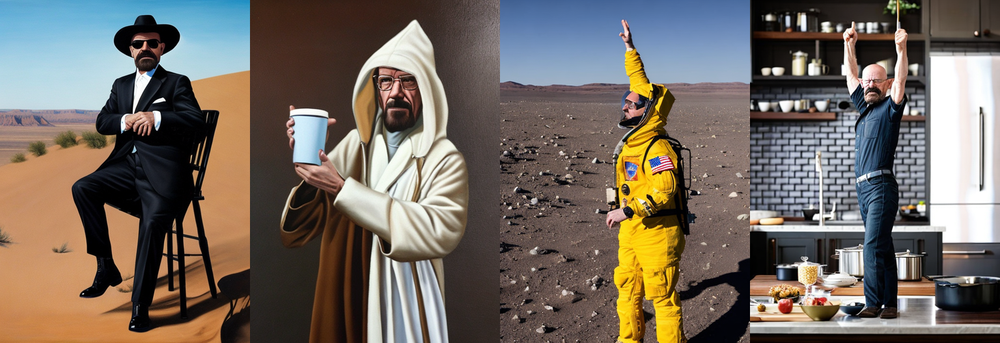

In [46]:
from diffusers import DEISMultistepScheduler

sd_controlpose.scheduler = DEISMultistepScheduler.from_config(sd_controlpose.scheduler.config)

prompt = ["oil painting walter white wearing a suit and black hat and sunglasses, face portrait, in the desert, realistic, vivid",
          "oil painting walter white wearing a jedi brown coat, face portrait, wearing a hood, holding a cup of coffee, in another planet, realistic, vivid",
          "professional photo of walter white wearing a space suit, face portrait, in mars, realistic, vivid",
          "professional photo of walter white in the kitchen, face portrait, realistic, vivid"]

neg_prompt = ["helmet, ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"] * len(prompt)


generator = torch.Generator(device="cuda").manual_seed(seed)
output = sd_controlpose(
    prompt,
    poses,
    negative_prompt=neg_prompt,
    generator=generator,
    num_inference_steps=30,
)
grid_img(output.images, 1, len(prompt), 0.75)

> Sitting pose

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


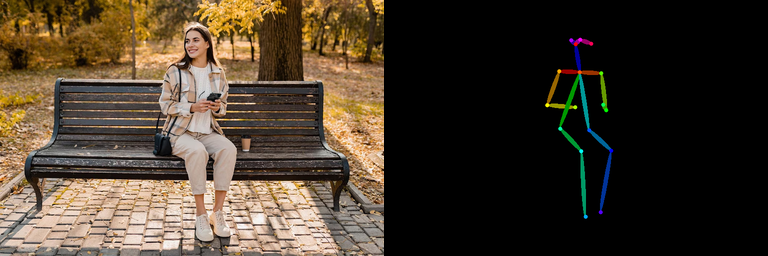

In [48]:
img_pose = Image.open("/content/drive/MyDrive/Udemy/Image Generation/images/bench02_img.jpg")

pose = pose_model(img_pose)

grid_img([img_pose, pose], 1, 2, scale=0.5)

  0%|          | 0/20 [00:00<?, ?it/s]

<ipython-input-4-d1ba74590e24>:11: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img = img.resize((w,h), Image.ANTIALIAS)


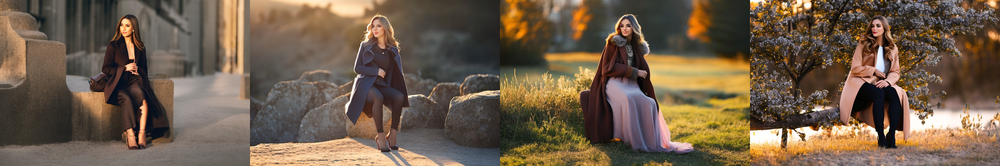

In [49]:
prompt = "professional photo of a young woman sitting in a , wearing a coat, sharp focus, insanely detailed, photorealistic, sunset, side light"
neg_prompt = "ugly, tiling, closed eyes, poorly drawn hands, poorly drawn feet, poorly drawn face, out of frame, extra limbs, disfigured, deformed, body out of frame, bad anatomy, watermark, signature, cut off, low contrast, underexposed, overexposed, bad art, beginner, amateur, distorted face"

generator = torch.Generator(device="cuda").manual_seed(seed)

imgs = sd_controlpose(
    prompt,
    pose,
    negative_prompt=neg_prompt,
    num_images_per_prompt=4,
    generator=generator,
    num_inference_steps=20,
)
grid_img(imgs.images, 1, 4, 0.75)